In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
from superRes.metrics import *


import torchvision
import geffnet # efficient/ mobile net

In [2]:
def do_fit(learn, epochs,save_name, lrs=slice(1e-3), pct_start=0.9):
    learn.fit_one_cycle(epochs, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=20)

In [3]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_256 = path/'DIV2K_train_LR_256_QF20'
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
path_lowRes_Full = path/'DIV2K_train_LR_Full_QF20'

proj_id = 'unet_superRes_mobilenetV3_MSE'

gen_name = proj_id + '_gen'
crit_name = proj_id + '_crit'

nf_factor = 2
pct_start = 1e-8

In [4]:
model = geffnet.mobilenetv3_rw

In [5]:
# loss_func = FeatureLoss()
# loss_func = msssim
# loss_func = fid
loss_func = F.mse_loss

# 256px

In [6]:
bs=5
sz=256
lr = 1e-2
wd = 1e-3
epochs = 1

In [7]:
data_gen = get_DIV2k_data_QF(path_lowRes_256, path_fullRes, bs=bs, sz=sz)

In [8]:
learn_gen = gen_learner_wide(data=data_gen,
                             gen_loss=loss_func,
                             arch = model,
                             nf_factor=nf_factor)

In [9]:
learn_gen.metrics.append(SSIM_Metric_gen())
learn_gen.metrics.append(SSIM_Metric_input())
learn_gen.metrics.append(LPIPS_Metric_gen())
learn_gen.metrics.append(LPIPS_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_gen())
learn_gen.metrics.append(BRISQUE_Metric_input())
learn_gen.metrics.append(BRISQUE_Metric_target())
learn_gen.metrics.append(NIQE_Metric_gen())
learn_gen.metrics.append(NIQE_Metric_input())
learn_gen.metrics.append(NIQE_Metric_target())

Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done
Setting up Perceptual loss...
Loading model from: /data/students_home/fmameli/anaconda3/envs/fastai/lib/python3.6/site-packages/perceptual_similarity/weights/v0.1/alex.pth
...[net-lin [alex]] initialized
...Done


In [10]:
wandbCallbacks = False

if wandbCallbacks:
    import wandb
    from wandb.fastai import WandbCallback
    config={"batch_size": bs,
            "img_size": (sz, sz),
            "learning_rate": lr,
            "weight_decay": wd,
            "num_epochs": epochs
    }
    wandb.init(project='SuperRes', config=config, id="unet_superRes_mobilenetV3_FID"+ datetime.now().strftime('_%m-%d_%H:%M'))

    learn_gen.callback_fns.append(partial(WandbCallback, input_type='images'))

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


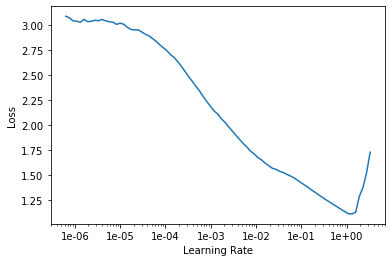

In [11]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()
# learn_gen.summary()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.265147,0.084230,0.645065,0.695172,0.199445,0.159935,80.777588,81.962106,79.666401,21.365181,20.969023,19.456907,01:56
1,0.080342,0.065756,0.700463,0.695172,0.161362,0.159935,81.409939,81.962106,79.666401,21.661615,20.969023,19.456907,01:48
2,0.069862,0.063889,0.705476,0.695172,0.155086,0.159935,81.386131,81.962106,79.666401,21.641235,20.969023,19.456907,01:48


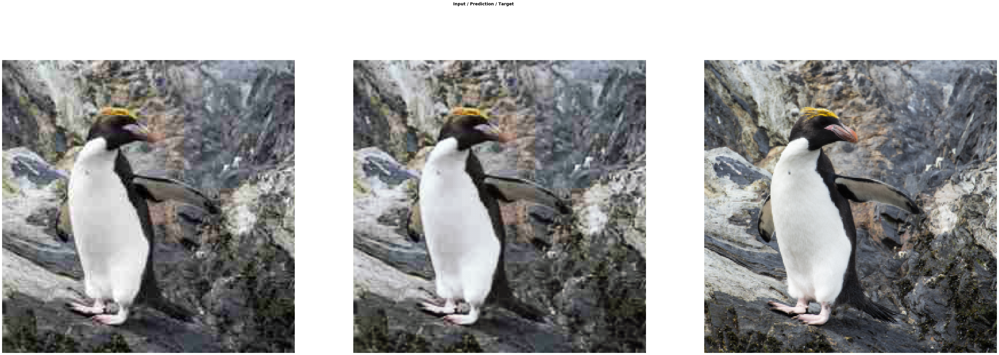

In [10]:
do_fit(learn_gen, 3, gen_name+"_256px_0", slice(lr*10))

In [11]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.065843,0.064826,0.703923,0.695172,0.155436,0.159935,81.304591,81.962106,79.666401,22.112093,20.969023,19.456907,01:51
1,0.067619,0.064069,0.703111,0.695172,0.158159,0.159935,81.390224,81.962106,79.666401,21.525810,20.969023,19.456907,01:50
2,0.067896,0.067474,0.706261,0.695172,0.160633,0.159935,81.368208,81.962106,79.666401,21.330389,20.969023,19.456907,02:00


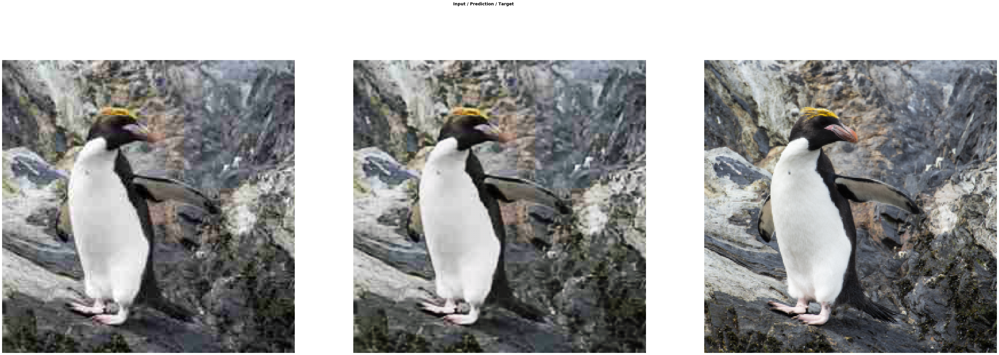

In [12]:
do_fit(learn_gen, 3, gen_name+"_256px_1", lr)

# 512px

In [13]:
bs=2
sz=512
epochs = 1

In [14]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [15]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

6540

In [14]:
# learn_gen.load(gen_name+"_256px_1")

Learner(data=ImageDataBunch;

Train: LabelList (800 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Valid: LabelList (100 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: dataset/DIV2K_train_LR_512;

Test: None, model=DynamicUnetWide(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): HardSwish()
      (3): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
           

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


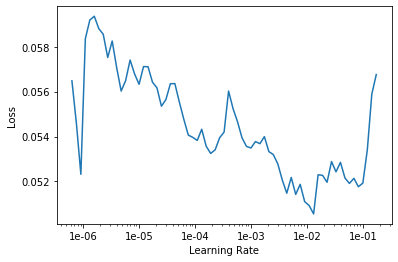

In [16]:
learn_gen.lr_find()
learn_gen.recorder.plot()

Upsize to gen_512


epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.050274,0.228065,0.694070,0.707517,0.198093,0.176500,86.675624,87.354943,85.322157,17.048279,17.860744,15.693551,06:59
1,0.054305,0.048730,0.719380,0.707517,0.174413,0.176500,88.138963,87.354943,85.322157,17.677925,17.860744,15.693551,06:49
2,0.056940,0.048311,0.723755,0.707517,0.177828,0.176500,88.559358,87.354943,85.322157,17.705908,17.860744,15.693551,07:02


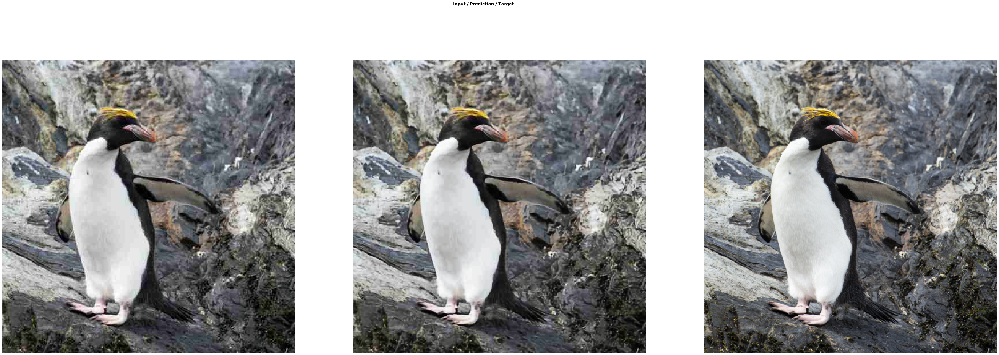

In [16]:
print("Upsize to gen_512")

do_fit(learn_gen, 3, gen_name+"_512px_0", slice(1e-2))

In [17]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


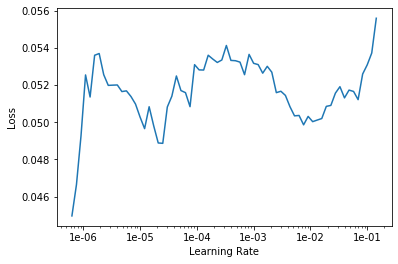

In [19]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.053567,0.047466,0.724507,0.707517,0.177460,0.176500,88.423175,87.354943,85.322157,17.760675,17.860744,15.693551,07:14
1,0.051546,0.046616,0.724691,0.707517,0.177345,0.176500,88.485616,87.354943,85.322157,17.816216,17.860744,15.693551,07:14
2,0.049189,0.047597,0.724471,0.707517,0.177648,0.176500,88.471648,87.354943,85.322157,17.738680,17.860744,15.693551,07:21


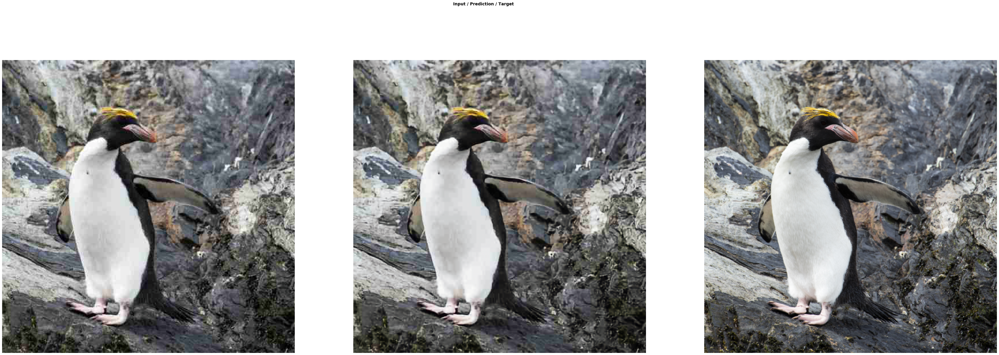

In [18]:
do_fit(learn_gen, 3, gen_name+"_512px_1", 1e-5)

In [19]:
bs=2
sz=512
epochs = 1

path_lowRes_512 = path/'DIV2K_train_LR_512_QF35'

In [20]:
data_gen = get_DIV2k_data_QF(path_lowRes_512, path_fullRes, bs=bs, sz=sz)

In [21]:
learn_gen.data = data_gen
learn_gen.freeze()
gc.collect()

13130

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.042995,0.715088,0.710305,0.765970,0.193261,0.116126,87.850836,86.647863,85.322157,17.083975,17.414343,15.693551,07:24


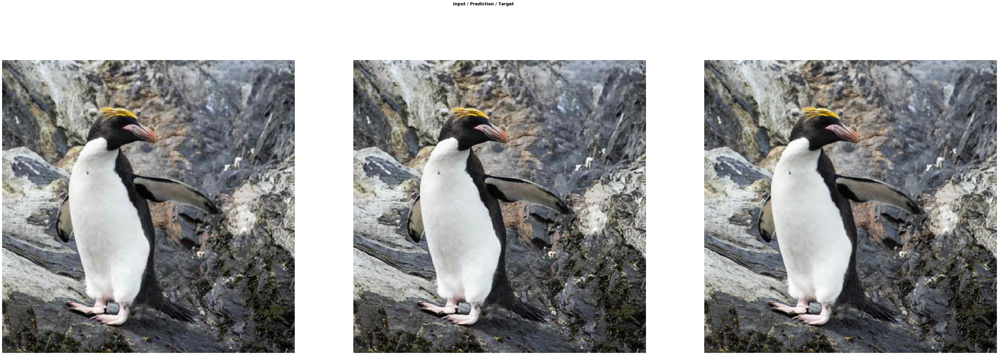

In [22]:
do_fit(learn_gen, 1, gen_name+"_512px_2", 1e-3)

In [23]:
learn_gen.unfreeze()

epoch,train_loss,valid_loss,ssim_gen,ssim_in,lpips_gen,lpips_in,brisque_gen,brisque_in,brisque_tar,niqe_gen,niqe_in,niqe_tar,time
0,0.043751,0.616511,0.726702,0.765970,0.183099,0.116126,88.140820,86.647863,85.322157,16.941444,17.414343,15.693551,06:53


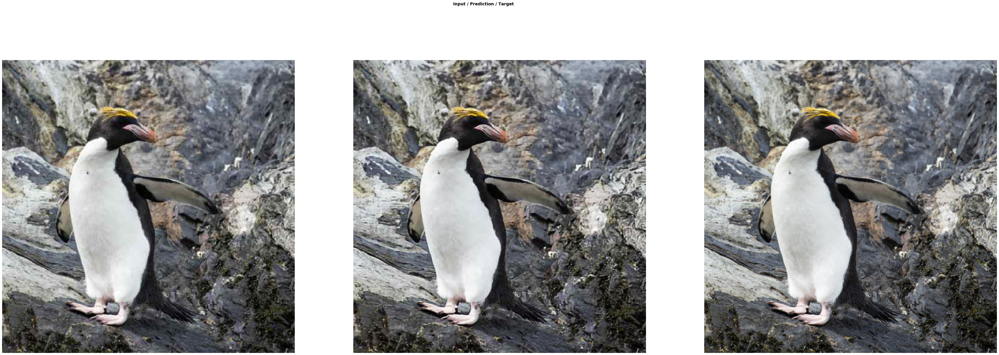

In [24]:
do_fit(learn_gen, 1, gen_name+"_512px_2", 1e-3)

# Validation

# Test

In [25]:
bs=1
sz=512
epochs = 1

In [38]:
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
size=( 512, 770)

data_1k = (ImageImageList.from_folder(path_lowRes_512, presort=True).split_by_idxs(
            train_idx=list(range(0, 800)), valid_idx=list(range(800, 900)))
          .label_from_func(lambda x: path_fullRes/x.name.replace(".jpg", ".png"))
          .transform(get_transforms(), size=size, tfm_y=True)
          .databunch(bs=1).normalize(imagenet_stats, do_y=True))
data_1k.c = 3

learn_gen.data = data_1k
learn_gen.freeze()
gc.collect()

11519

In [39]:
fn = data_1k.valid_dl.x.items[1]; fn

PosixPath('dataset/DIV2K_train_LR_512_QF20/0802.jpg')

In [40]:
img = open_image(fn); print(img.shape)
p,img_hr,b = learn_gen.predict(img)

torch.Size([3, 512, 770])


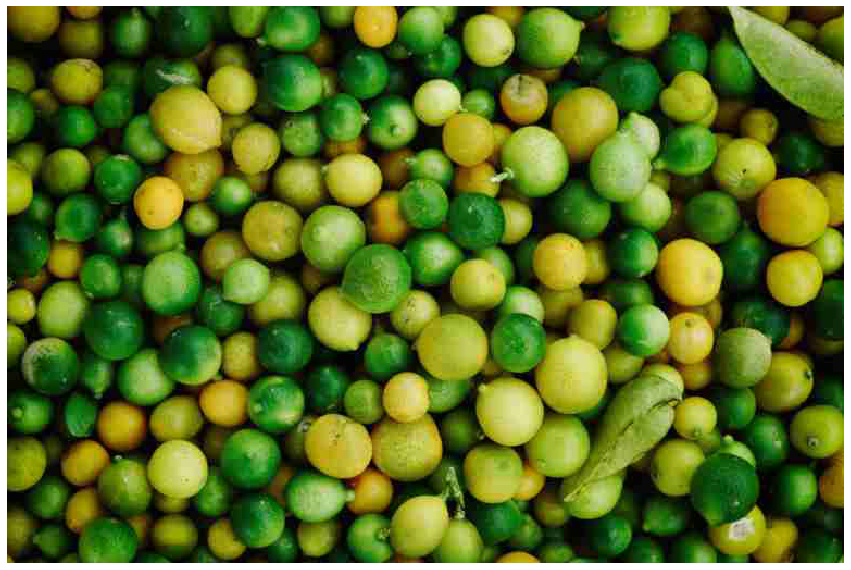

In [41]:
show_image(img, figsize=(15,15), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


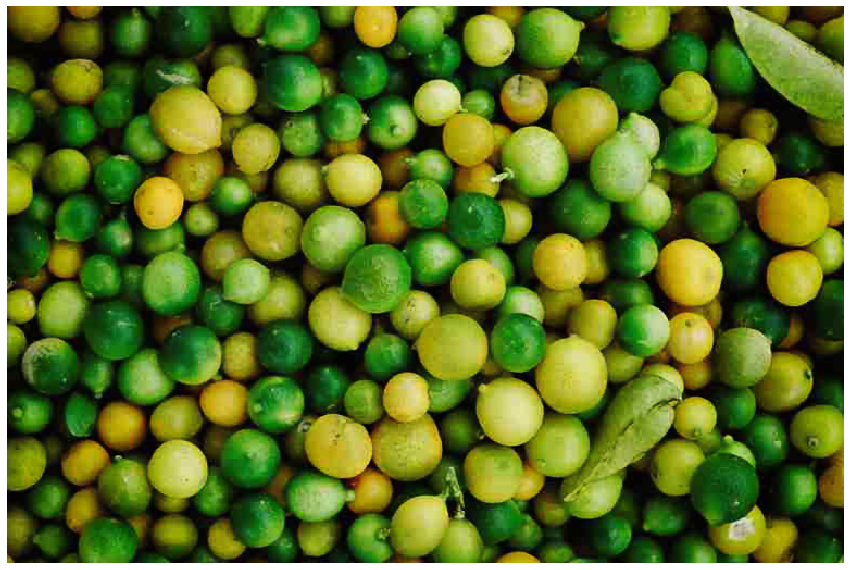

In [42]:
Image(img_hr).show(figsize=(15,15))